# K-Medoid

<br> 

Throughout this notebook, the K-Medoid model will be implemented on both the Original Zero and Nonzero Datasets. These datasets have been merely normalised and standardised and the relevant features have been selected. <br><br>
This shall act as an initial test to identify both the best category of models (i.e. K-Means, HAC, K-Medoids, DBSCAN and Fuzzy C-Means) and the best distance metrics (i.e. Euclidean, Manhattan, Minkowski, Gower and Cosine). <br><br>
N.B. Only the best models and their resepctive best performing distance metrics shall be utilised in later dimensionally reducted datasets.

## <u> Table of Contents </u>
* [Import the DataSet](#1)
* [Modelling Zero Data](#MMM)
    * [Elbow & Silhoutte: Zero](#23)
        * [Zero: K-Mode](#M3)
        * [Zero Visualisation](#N0)
* [Modelling Nonzero Data](#MMMM)
    * [Elbow & Silhoutte: Nonzero](#MU) 
        * [Nonzero: K-Mode](#M8)
        * [Nonzero Visualisation](#N00)
<br>

## Import the DataSet  <a class="anchor" id="1"></a>

In [1]:
#!pip install plotly
#!pip install joypy
#!pip install pyvis
#!pip install prince
#!pip install pyclustering
#!pip install clusteval
#!pip install kmodes
#!pip install gower
#!pip install scikit-learn-extra
#!pip install minisom
#!pip install fuzzy-c-means

In [2]:
# Remove the warnings

import warnings; warnings.simplefilter('ignore')

# Basic Packages

import pandas as pd
import numpy as np
from numpy import asarray
from numpy import save

# Set a random state 

np.random.seed(9)

# Notebook Setup

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last"
pd.set_option('display.max_columns', None)

# Plotting Packages

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
from matplotlib.widgets import SpanSelector
from bokeh.models import Div, RangeSlider, Spinner
from bokeh.plotting import figure, show
import plotly.express as px
import plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from joypy import joyplot
from pyvis.network import Network
from IPython.display import Image
import plotly.offline as pyo
from yellowbrick.cluster import KElbowVisualizer

# Set notebook mode to work in offline

pyo.init_notebook_mode()

# Packages for Transformations

import scipy.special
import prince
from sklearn.preprocessing import PowerTransformer
from scipy import stats
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import pairwise_distances


# Packages for Clustering

from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import KMeans
from clusteval import clusteval
from kmodes.kmodes import KModes
from kmedoids import fasterpam
from sklearn.cluster import AgglomerativeClustering 
import gower
from sklearn_extra.cluster import KMedoids
from sklearn.cluster import DBSCAN
from minisom import MiniSom
from sklearn.cluster import Birch
import scipy.cluster.hierarchy as shc
from fcmeans import FCM

# Packages to measure performance

from sklearn.metrics import silhouette_samples
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from scipy.spatial import distance as ssd
from pyclustering.cluster.kmedoids import kmedoids

In [3]:
# Import the zero dataset and remove unwanted columns

final_zero = pd.read_csv('/Users/cirillogirardi/Desktop/Dissertation/final_zero.csv')
final_zero.drop(columns=['Unnamed: 0'], inplace=True)
tra_zero = pd.read_csv('/Users/cirillogirardi/Desktop/Dissertation/tra_zero.csv')
tra_zero.drop(columns=['Unnamed: 0'], inplace=True)
zero_df = pd.read_csv('/Users/cirillogirardi/Desktop/Dissertation/zero_df.csv')
zero_df.drop(columns=['Unnamed: 0'], inplace=True)

# Import the nonzero dataset and remove unwanted columns

final_nonzero = pd.read_csv('/Users/cirillogirardi/Desktop/Dissertation/final_nonzero.csv')
final_nonzero.drop(columns=['Unnamed: 0'], inplace=True)
tra_nonzero = pd.read_csv('/Users/cirillogirardi/Desktop/Dissertation/tra_nonzero.csv')
tra_nonzero.drop(columns=['Unnamed: 0'], inplace=True)
nonzero_df = pd.read_csv('/Users/cirillogirardi/Desktop/Dissertation/nonzero_df.csv')
nonzero_df.drop(columns=['Unnamed: 0'], inplace=True)

In [4]:
# check if the finalzero dataset is correct

final_zero.head(1)

,volume_firm,liabilities_firm,bank_liabilities,other_liabilities,pl,banking_products,new_active_cc,new_passive_cc,new_commission_income,legal,p_membership,p_KK,p_fixeddeposits,p_propertyinsurance,p_companyinsurance,p_DZ,p_unionfunds,p_buildingsavings,p_mortgage,p_VRleasing,p_teambank,work,year,risk,postcode
0,-0.919737,-1.221589,-1.39815,-0.213653,-0.611916,-0.341303,-0.432425,-0.13513,-0.181772,16.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,208.0,13.0,1.0,32.0


In [5]:
# check if the transformed zero dataset is correct

tra_zero.head(1)

,client_type,legal,branch,volume_firm,liabilities_firm,liabilities,bank_liabilities,other_liabilities,pl_firm,pl,banking_products,other_products,p_membership,p_KK,p_creditcard,p_bankloans,p_fixeddeposits,p_WP2Depot,p_propertyinsurance,p_companyinsurance,p_DZ,p_DZP,p_unionfunds,p_buildingsavings,p_mortgage,p_VRleasing,p_teambank,new_active_cc,new_passive_cc,new_commission_income,new_cmib,work,year,risk,postcode,size
0,0.0,16.0,10.0,10.103612,9.181565,0.0,0.0,-11.512925,12.735183,14.697371,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,0.050022,26.431755,3.856511,208.0,13.0,1.0,32.0,1.0


In [6]:
# check if the original zero dataset is correct

zero_df.head(1)

,client_type,legal,branch,volume_firm,volume,loans_approved,loans_utilized,liabilities_firm,liabilities,bank_liabilities,other_liabilities,pl_firm,pl,banking_products,other_products,p_membership,p_KK,p_creditcard,p_bankloans,p_fixeddeposits,p_WP2Depot,p_propertyinsurance,p_companyinsurance,p_DZ,p_DZP,p_unionfunds,p_buildingsavings,p_mortgage,p_VRleasing,p_teambank,new_active_cc,new_passive_cc,new_commission_income,new_cmib,work,year,risk,postcode,size
0,0.0,16.0,10.0,31792.82,0.0,0.0,0.0,6103.29,0.0,0.0,0.0,47870.67,11518.478,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.05,47.25,47.3,208.0,13.0,1.0,32.0,1.0


In [7]:
# check if the final nonzero dataset is correct

final_nonzero.head(1)

,loans_approved,bank_liabilities,other_liabilities,pl,banking_products,new_active_cc,new_commission_income,client_type,legal,p_membership,p_KK,p_creditcard,p_fixeddeposits,p_WP2Depot,p_propertyinsurance,p_companyinsurance,p_DZ,p_mortgage,p_VRleasing,p_teambank,work,year,risk,postcode
0,-0.428154,-0.57338,-0.426741,-1.530136,-0.458714,0.300147,-0.464326,0.0,39.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,393.0,11.0,0.0,46.0


In [8]:
# check if the transformed nonzero dataset is correct

tra_nonzero.head(1)

,client_type,legal,branch,volume_firm,volume,loans_approved,loans_utilized,liabilities_firm,liabilities,bank_liabilities,other_liabilities,pl_firm,pl,banking_products,other_products,p_membership,p_KK,p_creditcard,p_bankloans,p_fixeddeposits,p_WP2Depot,p_propertyinsurance,p_companyinsurance,p_DZ,p_DZP,p_unionfunds,p_buildingsavings,p_mortgage,p_VRleasing,p_teambank,new_active_cc,new_passive_cc,new_commission_income,new_cmib,work,year,risk,postcode,size
0,0.0,39.0,23.0,8.333568,7.697297,9.93363,10.883836,7.523551,10.231201,9.80453,-0.0,7.444261,9.518547,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.180153,2.5096,13.890309,5.466413,393.0,11.0,0.0,46.0,1.0


In [9]:
# check if the original nonzero dataset is correct

nonzero_df.head(1)

,client_type,legal,branch,volume_firm,volume,loans_approved,loans_utilized,liabilities_firm,liabilities,bank_liabilities,other_liabilities,pl_firm,pl,banking_products,other_products,p_membership,p_KK,p_creditcard,p_bankloans,p_fixeddeposits,p_WP2Depot,p_propertyinsurance,p_companyinsurance,p_DZ,p_DZP,p_unionfunds,p_buildingsavings,p_mortgage,p_VRleasing,p_teambank,new_active_cc,new_passive_cc,new_commission_income,new_cmib,work,year,risk,postcode,size
0,0.0,39.0,23.0,12988.79,12988.79,12988.79,12988.79,748.17,748.17,748.17,0.0,7388.77,7388.77,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,177.71,12.3,46.6,236.61,393.0,11.0,0.0,46.0,1.0


## Model Definition

<br>

## Modelling Zero Data <a class="anchor" id="MMM"></a>

For the evaluation of FasterPAM we need to create a dissimilarity matrix.

In [10]:
# initially we transform the df to a numpy array 

mat = final_zero.to_numpy()

# we develop a dissimilarity matrix using euclidean distance

mat_eu = pairwise_distances(mat, metric='euclidean')

In [11]:
# we develop a dissimilarity matrix using minkowski distance

mat_man = pairwise_distances(mat, metric='manhattan')

In [12]:
# we develop a dissimilarity matrix using minkowski distance

mat_min = pairwise_distances(mat, metric='minkowski')

In [13]:
# we develop a dissimilarity matrix using cosine for fasterpam

mat_cos = pairwise_distances(mat, metric='cosine')

In [14]:
# we develop a dissimilarity matrix using gower for fasterpam

mat_gower = gower.gower_matrix(mat)

<br>

## Elbow & Silhoutte: Zero  <a class="anchor" id="23"></a>

**Zero Data-Set**

<br><br>
For K-Medoids we cannot use the package clusteval, as a result we adopt the package KElbowVisualizer. This allows to test the Elbow once again and visualise the amount of time taken to compute the clusters. <br> <br>
We now test all different distances to identify the best performing one.

### Euclidean

##### K-Medoids

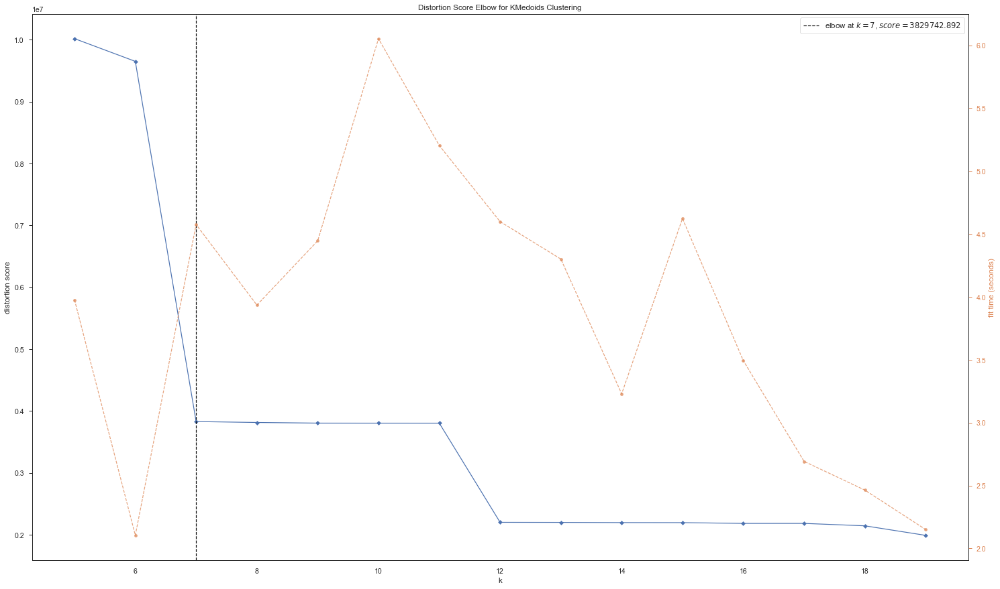

<AxesSubplot:title={'center':'Distortion Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='distortion score'>

In [15]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot

fig, ax = plt.subplots(figsize=(25,15))

# Utilise the Elbow Visualiser package and specify the details of the model

elb = KElbowVisualizer(KMedoids(metric = 'euclidean', random_state=9), k=(5,20), color=['#002034', "#82ceff"])
elb.fit(final_zero)        
elb.show()

##### FastrPAM

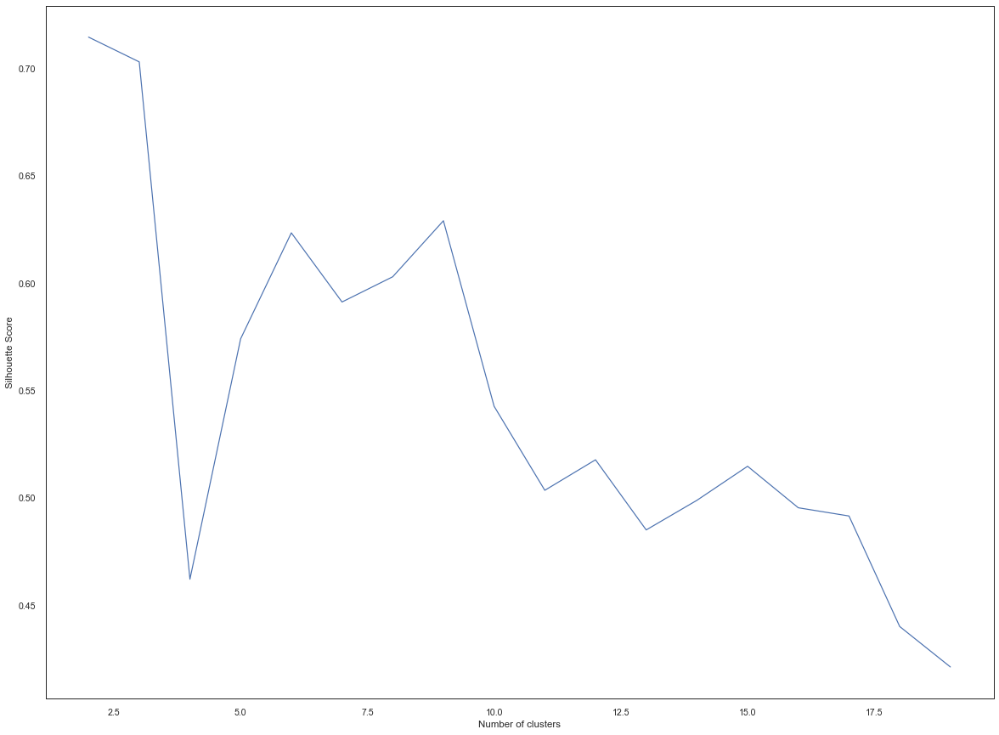

In [16]:
plt.figure(figsize=(20,15))

# create a dictionary of results

results = {}

# create a loop to ieterate through different options

for i in range(2,20):
    m = fasterpam(mat_eu , medoids = i, max_iter = 1000, init ='random',) # specify the model and dataset
    labels = m.labels # retrieve the labels
    sil_index = silhouette_score(mat_eu, labels) # calculate the silhoutte score
    results.update({i: sil_index}) # update the results on the dictionary
    

# plot the results and their respective values

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

### Minkowski

##### K-Medoids

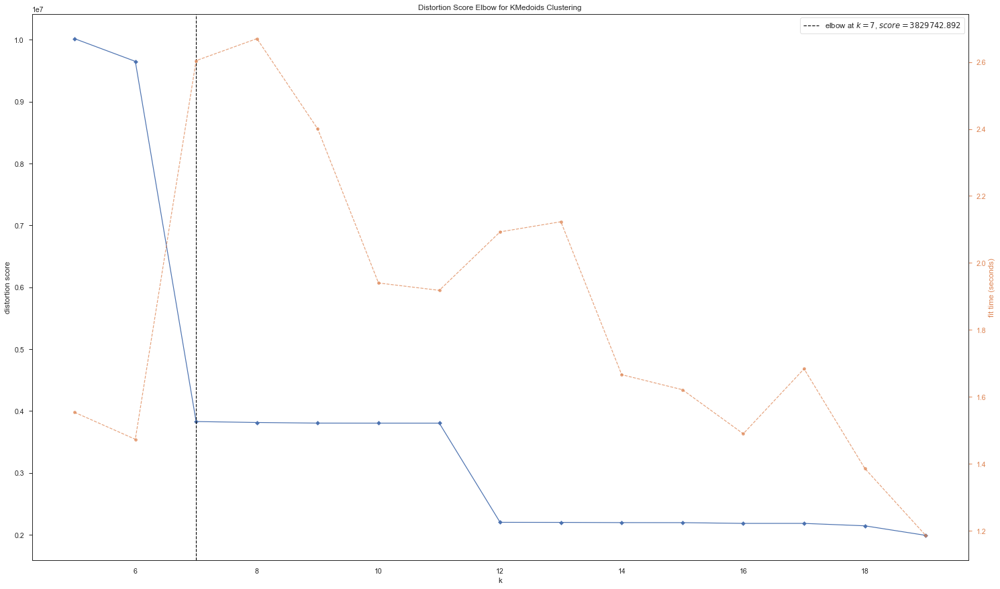

<AxesSubplot:title={'center':'Distortion Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='distortion score'>

In [17]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot

fig, ax = plt.subplots(figsize=(25,15))

# Utilise the Elbow Visualiser package and specify the details of the model

elb = KElbowVisualizer(KMedoids(metric = 'minkowski', random_state=9), k=(5,20), color=['#002034', "#82ceff"])
elb.fit(final_zero)        
elb.show()

##### FastrPAM

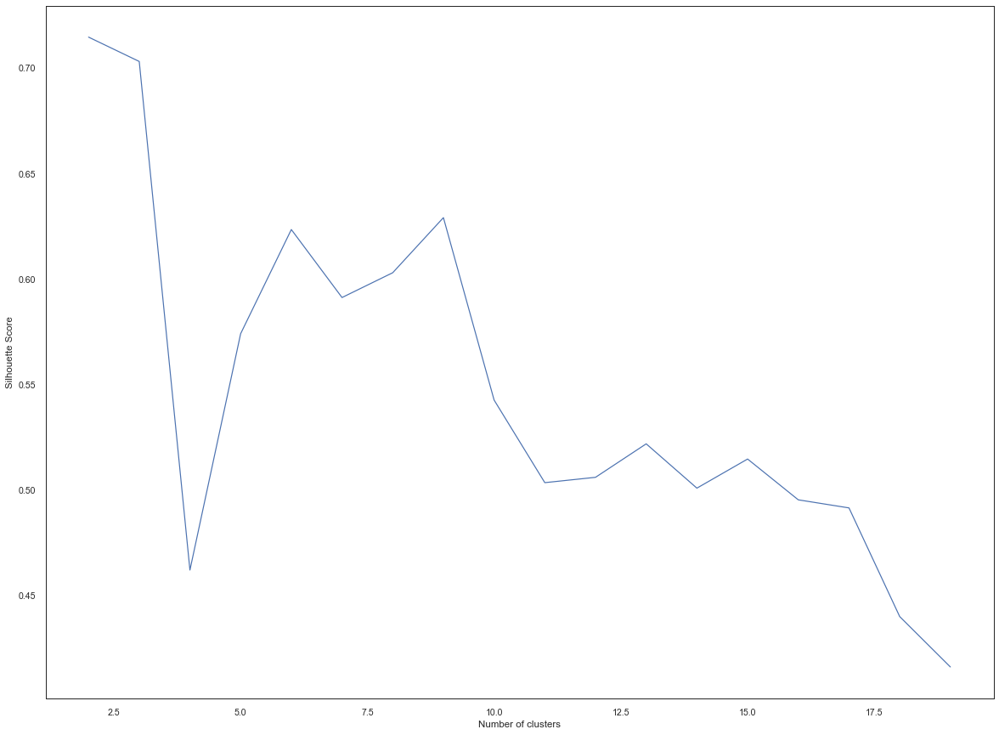

In [18]:
plt.figure(figsize=(20,15))

# create a dictionary of results

results = {}

# create a loop to ieterate through different options

for i in range(2,20):
    m = fasterpam(mat_min , medoids = i, max_iter = 1000, init ='random',) # specify the model and dataset
    labels = m.labels # retrieve the labels
    sil_index = silhouette_score(mat_min, labels) # calculate the silhoutte score
    results.update({i: sil_index}) # update the results on the dictionary
    

# plot the results and their respective values

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

### Manhattan

##### K-Medoids

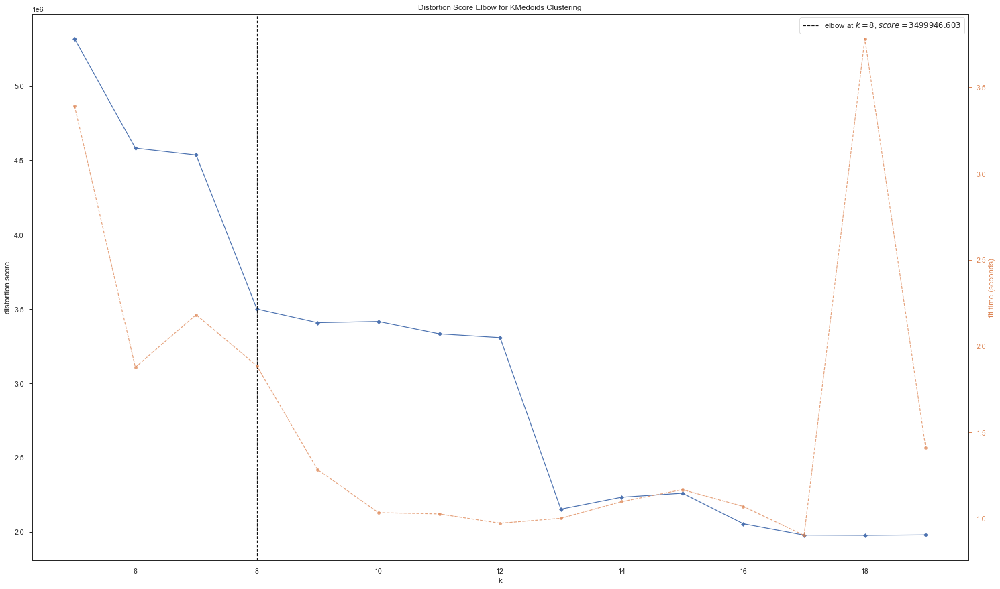

<AxesSubplot:title={'center':'Distortion Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='distortion score'>

In [19]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot

fig, ax = plt.subplots(figsize=(25,15))

# Utilise the Elbow Visualiser package and specify the details of the model

elb = KElbowVisualizer(KMedoids(metric = 'manhattan', random_state=9), k=(5,20), color=['#002034', "#82ceff"])
elb.fit(final_zero)        
elb.show()

##### FastrPAM

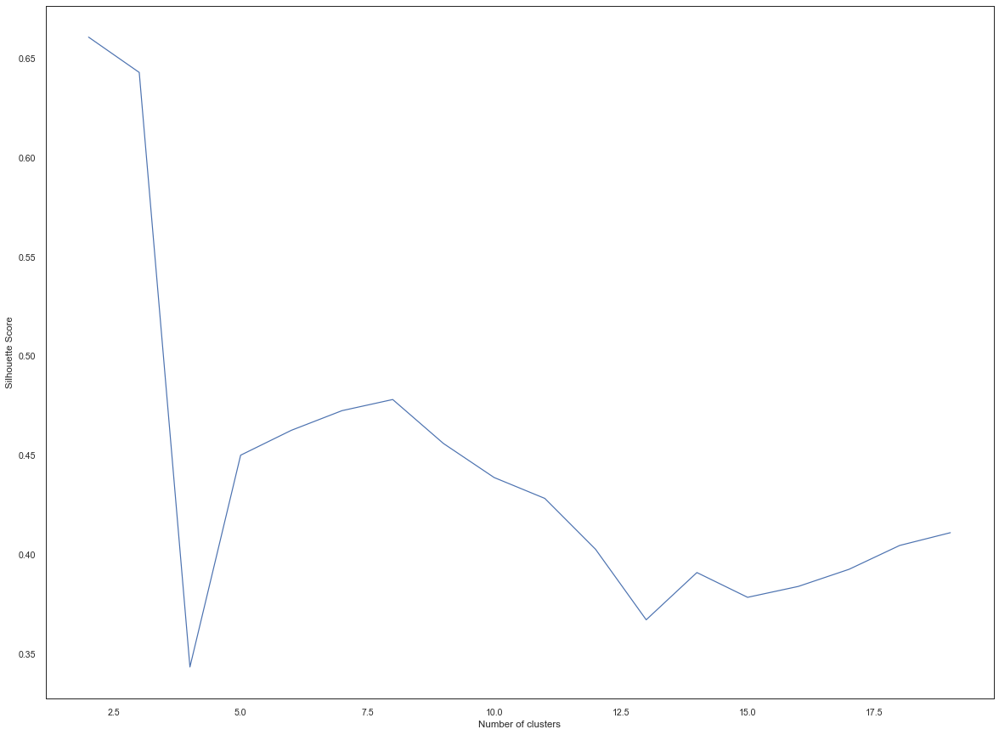

In [20]:
plt.figure(figsize=(20,15))

# create a dictionary of results

results = {}

# create a loop to ieterate through different options

for i in range(2,20):
    m = fasterpam(mat_man , medoids = i, max_iter = 1000, init ='random',) # specify the model and dataset
    labels = m.labels # retrieve the labels
    sil_index = silhouette_score(mat_man, labels) # calculate the silhoutte score
    results.update({i: sil_index}) # update the results on the dictionary
    

# plot the results and their respective values

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

## Gower

##### K-Medoids

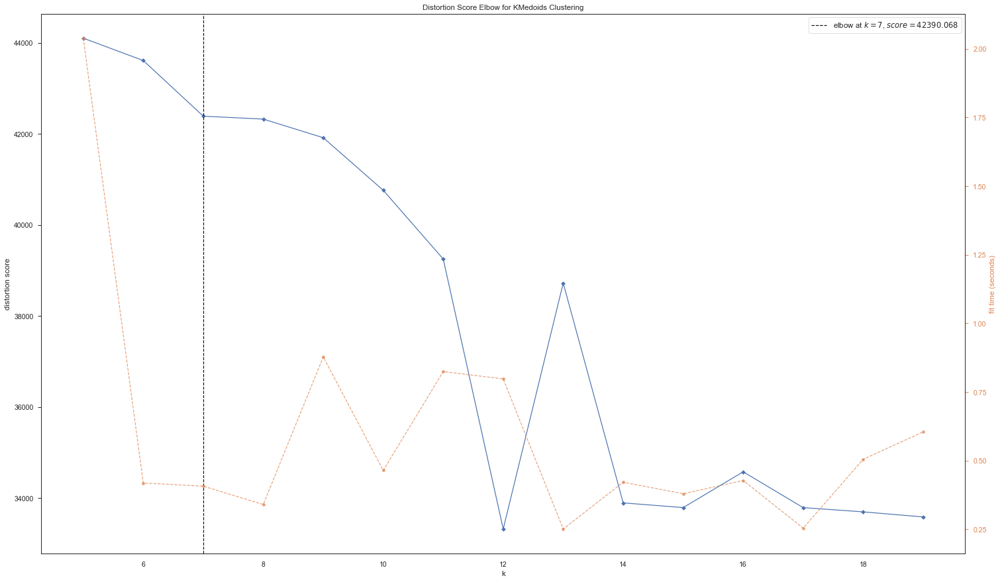

<AxesSubplot:title={'center':'Distortion Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='distortion score'>

In [21]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot

fig, ax = plt.subplots(figsize=(25,15))

# Utilise the Elbow Visualiser package and specify the details of the model

elb = KElbowVisualizer(KMedoids(metric = 'precomputed', random_state=9), k=(5,20), color=['#002034', "#82ceff"])
elb.fit(mat_gower)        
elb.show()

##### FastrPAM

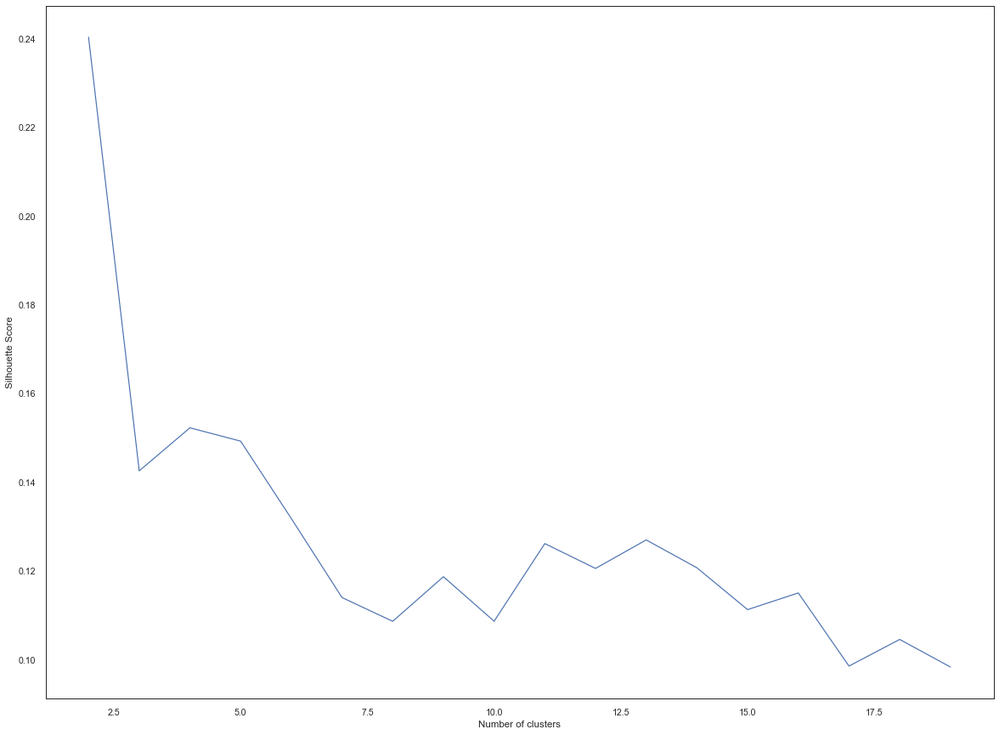

In [22]:
plt.figure(figsize=(20,15))

# create a dictionary of results

results = {}

# create a loop to ieterate through different options

for i in range(2,20):
    m = fasterpam(mat_gower , medoids = i, max_iter = 1000, init ='random',) # specify the model and dataset
    labels = m.labels # retrieve the labels
    sil_index = silhouette_score(mat_gower, labels) # calculate the silhoutte score
    results.update({i: sil_index}) # update the results on the dictionary
    

# plot the results and their respective values

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

### Cosine

##### K-Medoids

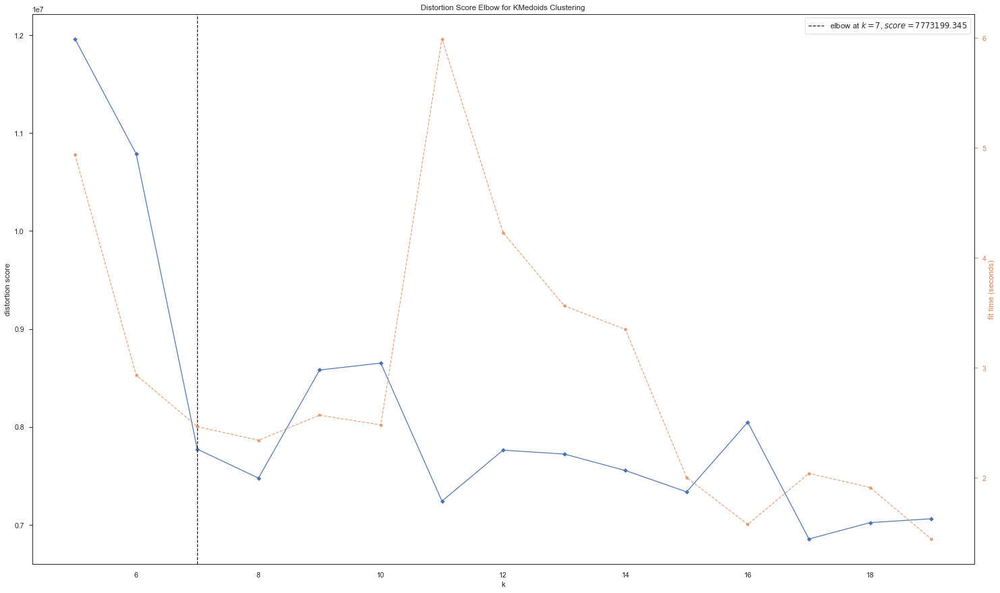

<AxesSubplot:title={'center':'Distortion Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='distortion score'>

In [23]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot

fig, ax = plt.subplots(figsize=(25,15))

# Utilise the Elbow Visualiser package and specify the details of the model

elb = KElbowVisualizer(KMedoids(metric = 'cosine', random_state=9), k=(5,20), color=['#002034', "#82ceff"])
elb.fit(final_zero)        
elb.show()

##### FastrPAM

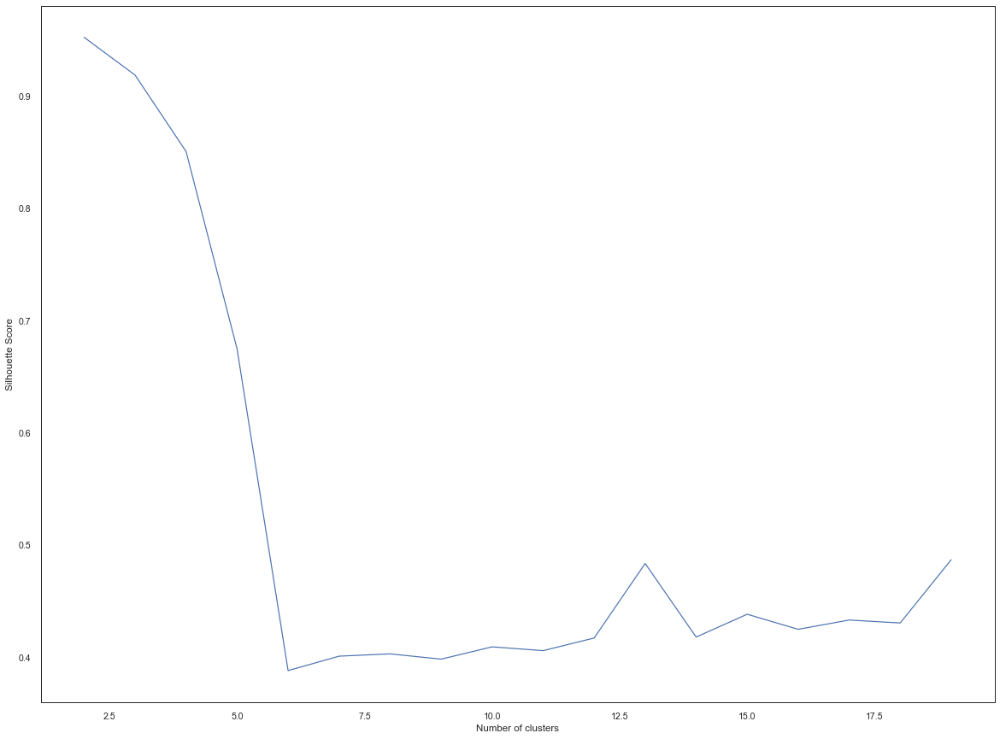

In [24]:
plt.figure(figsize=(20,15))

# create a dictionary of results

results = {}

# create a loop to ieterate through different options

for i in range(2,20):
    m = fasterpam(mat_cos , medoids = i, max_iter = 1000, init ='random',) # specify the model and dataset
    labels = m.labels # retrieve the labels
    sil_index = silhouette_score(mat_cos, labels) # calculate the silhoutte score
    results.update({i: sil_index}) # update the results on the dictionary
    

# plot the results and their respective values

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

## Best Performing Distance

The best performing distance was the Minkowski distance, followed by the Euclidean. <br>

As a result we are going to apply a Minkowski distance and use 9 medoids for K-Medoids and 7 for FasterPAM. <br>

###  Zero

#### K-Mode <a class="anchor" id="M3"></a>

In [25]:
# we set the function for K-Mode

km_zero = KMedoids(n_clusters=9, init='build', max_iter = 1000, metric = 'minkowski', random_state = 9)

fast_zero = fasterpam(mat_min, medoids = 7, max_iter = 1000, init ='random', random_state = 9)

# Fit the function to the original zero dataset

km_zero.fit(final_zero)

# Assign the labels to the respective rows and further view the cluster segmentation 

final_zero["Cluster_kmode"] = km_zero.labels_
tra_zero['Cluster_kmode'] = km_zero.labels_

zero_df["Cluster_kmode"] = km_zero.labels_
print('Distribution of Clusters: \n')
print(zero_df['Cluster_kmode'].value_counts())
print('\n')

# Assign the labels to the respective rows and further view the cluster segmentation 

final_zero["Cluster_fast"] = fast_zero.labels
tra_zero['Cluster_fast'] = fast_zero.labels

zero_df["Cluster_fast"] = fast_zero.labels
print('Distribution of Clusters: \n')
print(zero_df['Cluster_fast'].value_counts())

Distribution of Clusters: 

2    1392
0     705
7     652
5     585
6     494
4     453
8     372
3     345
1     188
Name: Cluster_kmode, dtype: int64


Distribution of Clusters: 

0    1399
1    1103
2     657
3     585
4     555
5     486
6     401
Name: Cluster_fast, dtype: int64


In [26]:
print('The performance scores are the following: \n' )
print('KMedoids:')
print('Silhouette: ' + str(silhouette_score(final_zero, final_zero["Cluster_kmode"])))
print('Calinski Harabasz: ' + str(calinski_harabasz_score(final_zero, final_zero["Cluster_kmode"])))
print('Davies Bouldin: ' + str(davies_bouldin_score(final_zero, final_zero["Cluster_kmode"])))
print('\n')
print('FasterPAM')
print('Silhouette: ' + str(silhouette_score(final_zero, final_zero["Cluster_fast"])))
print('Calinski Harabasz: ' + str(calinski_harabasz_score(final_zero, final_zero["Cluster_fast"])))
print('Davies Bouldin: ' + str(davies_bouldin_score(final_zero, final_zero["Cluster_fast"])))

The performance scores are the following: 

KMedoids:
Silhouette: 0.4850600159785659
Calinski Harabasz: 21585.517921577302
Davies Bouldin: 0.7991073555230753


FasterPAM
Silhouette: 0.4927540847840195
Calinski Harabasz: 19944.508414496155
Davies Bouldin: 0.702252938323206


<br>
The best performing model is the FastPAM with Minkowski distance, as a consequence we are going to adopt this throughout later dimensionally reduced datasets. <br>

### Zero Visualisation <a class="anchor" id="N0"></a>

We now visualise the clusters. <br>

In [10]:
#PCA with two components

pca_2d = PCA(n_components=2)

#PCA with three components

pca_3d = PCA(n_components=3)

In [28]:
# we remove the clusters from a new dataset

tt = tra_zero.drop(columns=['Cluster_fast', 'Cluster_kmode'])

# we create two dfs, one for 2 components and one for 3

PCs_2d = pd.DataFrame(pca_2d.fit_transform(tt))
PCs_3d = pd.DataFrame(pca_3d.fit_transform(tt))


# PC1_2d: The first component. PC2_2d: The second component, etc-

PCs_2d.columns = ["PC1_2d", "PC2_2d"]

PCs_3d.columns = ["PC1_3d", "PC2_3d", "PC3_3d"]

# we create a new df

tra_zero1 = tra_zero.copy()

# we concatonate all dfs together to then derive visuals

tra_zero1 = pd.concat([tra_zero1,PCs_2d,PCs_3d], axis=1, join='inner')

In [29]:
# we create a new variable for each cluster in the dataset so we create two empty lists

cluster = []
idd = []

# we then create a loop to iterate through the values

for i in tra_zero1["Cluster_fast"].value_counts().index:
    n = i
    id_ = 'cluster_' + str(n) # for each id we create a new variable
    m = str(id_) +  ' = ' + 'tra_zero1[tra_zero1["Cluster_fast"] == ' + str(n) + ']' # we then define the variable 
    idd.append(id_) # we append its id to the list
    cluster.append(m) # we append the variable to the list

# we then create a loop to execute all of the new variables created
    
for i in cluster:
    exec(i)

    
# we create two new lists, one to contain the different PCA plots, the other to store the trace (i.e. id of the plot)
    
nn = []
l = []    
for i in idd:
    b = 'trace' + i 
    p = 'go.Scatter(x =' + i + '["PC1_2d"], y =' + i + '["PC2_2d"], mode = "markers", text = None)'
    l.append(b)
    nn.append(p)
    
# we create a dictionary to ensure that all traces are correctly defined  
    
commands = {}
for a,b in zip(nn,l):
    key=str(b)
    commands[key]=a

# we execute the dictionary and create the individual plots  
    
for key, value in commands.items():
    exec (f'{key}={value}')            
   

In [30]:
# we retrieve all the new features

for i in l:
    print(i)

tracecluster_0
tracecluster_1
tracecluster_2
tracecluster_3
tracecluster_4
tracecluster_5
tracecluster_6


In [31]:
# we set a title for the graph

title = "Visualizing Clusters in Two Dimensions Using PCA"


# we set an appropriate layout 

layout = dict(title = title,
              xaxis= dict(title= 'P1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'P2',ticklen= 5,zeroline= False)
             )

# we zip all the traces to create one figure

fig =  go.Figure(dict(data = [tracecluster_0,
tracecluster_1,
tracecluster_2,
tracecluster_3,
tracecluster_4,
tracecluster_5,
tracecluster_6]), layout = layout)

pyo.iplot(fig)

# we save the dataset

fig.write_image("Kmode_orig_2_Z.png", scale=2)

In [32]:
nn = []
l = []    
for i in idd:
    b = 'trace' + i 
    p = 'go.Scatter3d(x =' + i + '["PC1_2d"], y =' + i + '["PC2_2d"], z =' + i + '["PC3_3d"], mode = "markers", text = None)'
    l.append(b)
    nn.append(p)
    
commands = {}
for a,b in zip(nn,l):
    key=str(b)
    commands[key]=a
            
for key, value in commands.items():
    exec (f'{key}={value}')     

In [33]:
for i in l:
    print(i)

tracecluster_0
tracecluster_1
tracecluster_2
tracecluster_3
tracecluster_4
tracecluster_5
tracecluster_6


In [34]:
# we set a title for the graph

title = "Visualizing Clusters in Three Dimensions Using PCA"


# we set an appropriate layout 

layout = dict(title = title,
              xaxis= dict(title= 'P1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'P2',ticklen= 5,zeroline= False)
             )

# we zip all the traces to create one figure

fig =  go.Figure(dict(data = [tracecluster_0,
tracecluster_1,
tracecluster_2,
tracecluster_3,
tracecluster_4,
tracecluster_5,
tracecluster_6]), layout = layout)

pyo.iplot(fig)

# we save the dataset

fig.write_image("Kmode_orig_3_Z.png", scale=2)

<br>

## Modelling Nonzero Data <a class="anchor" id="MMMM"></a>

For the evaluation of FasterPAM we need to create other dissimilarity matrices.

In [11]:
# initially we transform the df to a numpy array 

mat_n = final_nonzero.to_numpy()

# we develop a dissimilarity matrix using euclidean distance

mat_eu_n = pairwise_distances(mat_n, metric='euclidean')

In [12]:
# we develop a dissimilarity matrix using minkowski distance

mat_man_n = pairwise_distances(mat_n, metric='manhattan')

In [13]:
# we develop a dissimilarity matrix using minkowski distance

mat_min_n = pairwise_distances(mat_n, metric='minkowski')

In [14]:
# we develop a dissimilarity matrix using cosine for fasterpam

mat_cos_n = pairwise_distances(mat_n, metric='cosine')

In [15]:
# we develop a dissimilarity matrix using gower for fasterpam

mat_gower_n = gower.gower_matrix(mat_n)

<br>

## Elbow & Silhoutte: Nonzero  <a class="anchor" id="MU"></a>

**Non-Zero DataSet**

Once again we se what distance is best fit for the model and the data. <br>

### Euclidean

##### K-Medoids

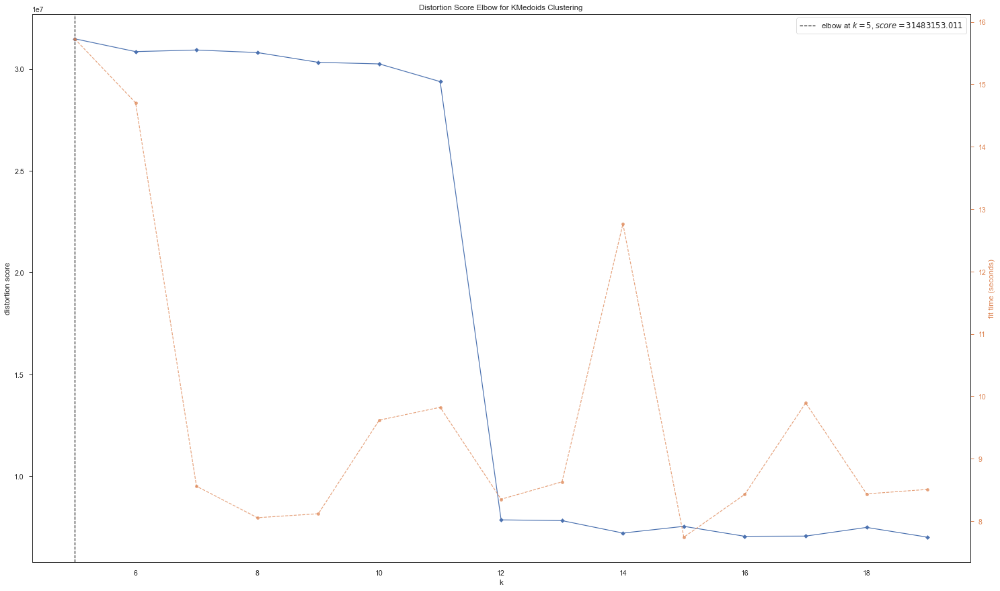

<AxesSubplot:title={'center':'Distortion Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='distortion score'>

In [16]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot

fig, ax = plt.subplots(figsize=(25,15))

# Utilise the Elbow Visualiser package and specify the details of the model

elb = KElbowVisualizer(KMedoids(metric = 'euclidean', random_state=9), k=(5,20), color=['#002034', "#82ceff"])
elb.fit(final_nonzero)        
elb.show()

##### FasterPAM

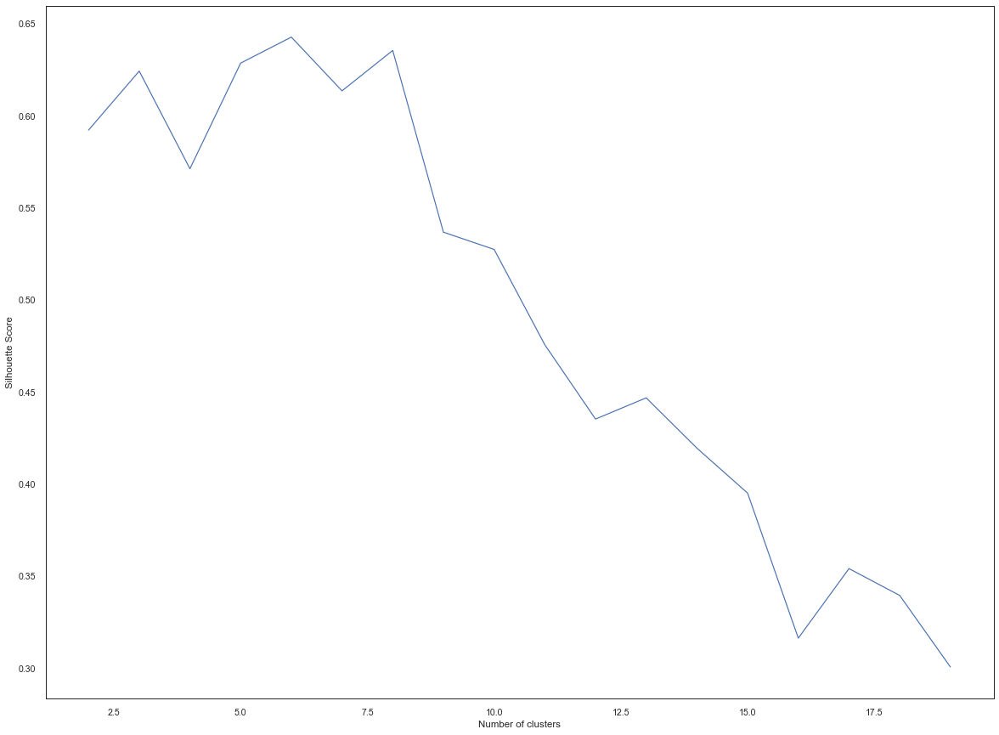

In [17]:
##### FasterPAMplt.figure(figsize=(20,15))

# create a dictionary of results

results = {}

# create a loop to ieterate through different options

for i in range(2,20):
    m = fasterpam(mat_eu_n , medoids = i, max_iter = 1000, init ='random',) # specify the model and dataset
    labels = m.labels # retrieve the labels
    sil_index = silhouette_score(mat_eu_n, labels) # calculate the silhoutte score
    results.update({i: sil_index}) # update the results on the dictionary
    

# plot the results and their respective values

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

### Minkowski

##### K-Medoids

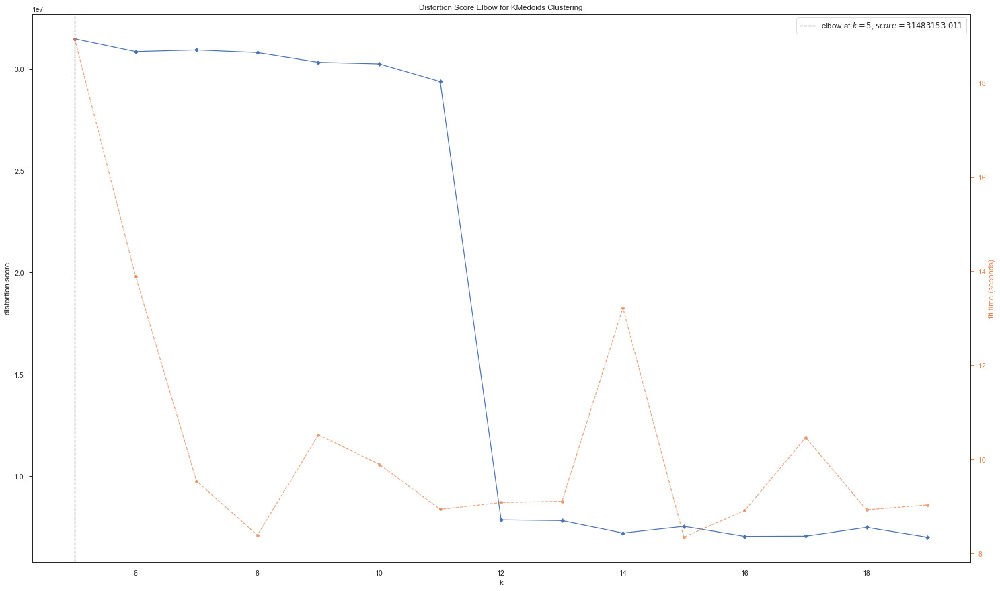

<AxesSubplot:title={'center':'Distortion Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='distortion score'>

In [18]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot

fig, ax = plt.subplots(figsize=(25,15))

# Utilise the Elbow Visualiser package and specify the details of the model

elb = KElbowVisualizer(KMedoids(metric = 'minkowski', random_state=9), k=(5,20), color=['#002034', "#82ceff"])
elb.fit(final_nonzero)        
elb.show()

##### FasterPAM

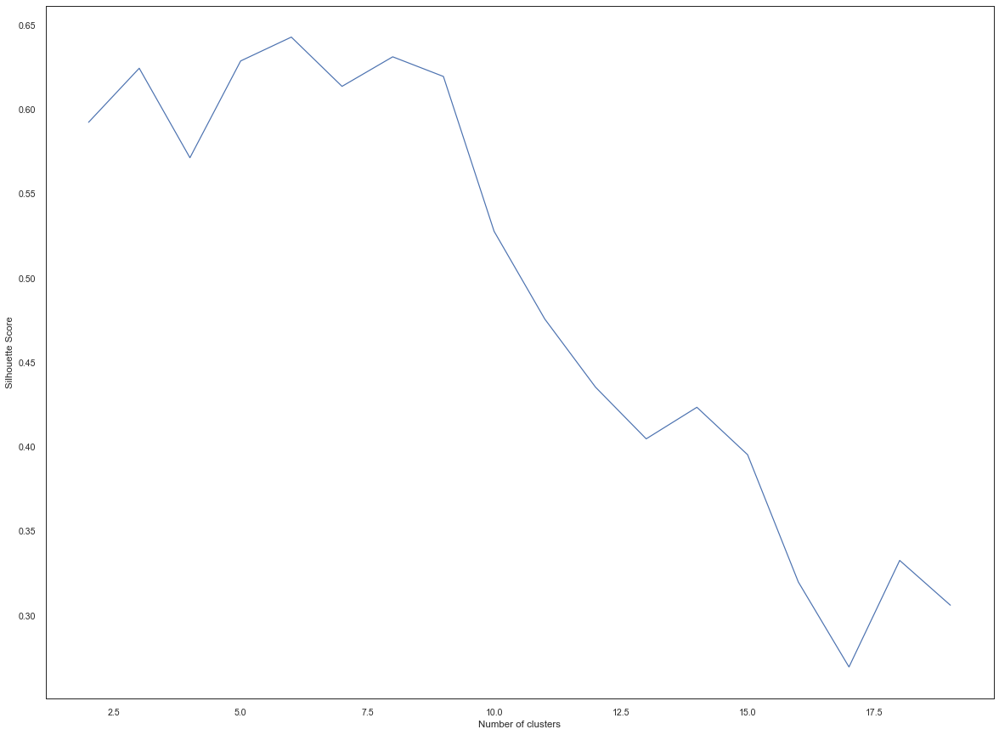

In [19]:
plt.figure(figsize=(20,15))

# create a dictionary of results

results = {}

# create a loop to ieterate through different options

for i in range(2,20):
    m = fasterpam(mat_min_n, medoids = i, max_iter = 1000, init ='random',) # specify the model and dataset
    labels = m.labels # retrieve the labels
    sil_index = silhouette_score(mat_min_n, labels) # calculate the silhoutte score
    results.update({i: sil_index}) # update the results on the dictionary
    

# plot the results and their respective values

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

### Manhattan

##### K-Medoids

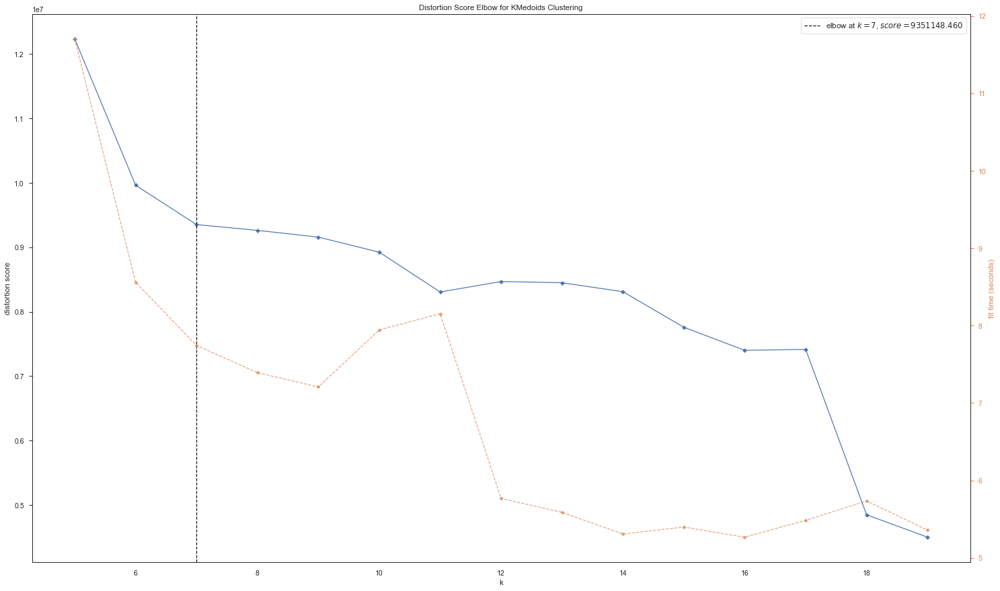

<AxesSubplot:title={'center':'Distortion Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='distortion score'>

In [20]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot

fig, ax = plt.subplots(figsize=(25,15))

# Utilise the Elbow Visualiser package and specify the details of the model

elb = KElbowVisualizer(KMedoids(metric = 'manhattan', random_state=9), k=(5,20), color=['#002034', "#82ceff"])
elb.fit(final_nonzero)        
elb.show()

##### FasterPAM

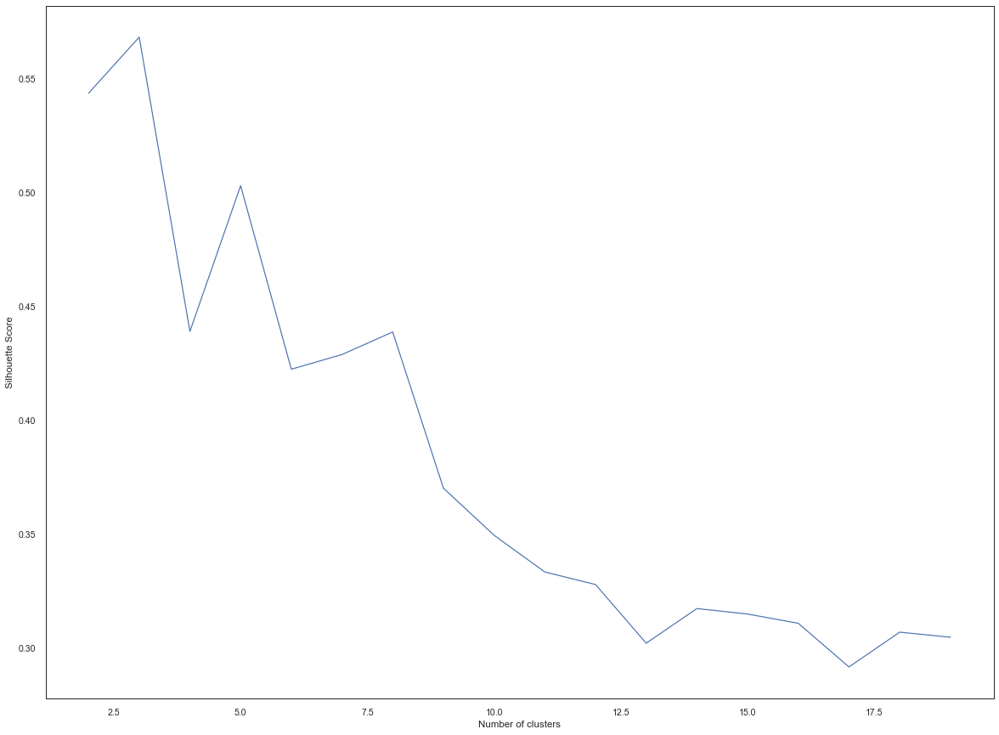

In [21]:
plt.figure(figsize=(20,15))

# create a dictionary of results

results = {}

# create a loop to ieterate through different options

for i in range(2,20):
    m = fasterpam(mat_man_n, medoids = i, max_iter = 1000, init ='random',) # specify the model and dataset
    labels = m.labels # retrieve the labels
    sil_index = silhouette_score(mat_man_n, labels) # calculate the silhoutte score
    results.update({i: sil_index}) # update the results on the dictionary
    

# plot the results and their respective values

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

## Gower

##### K-Medoids

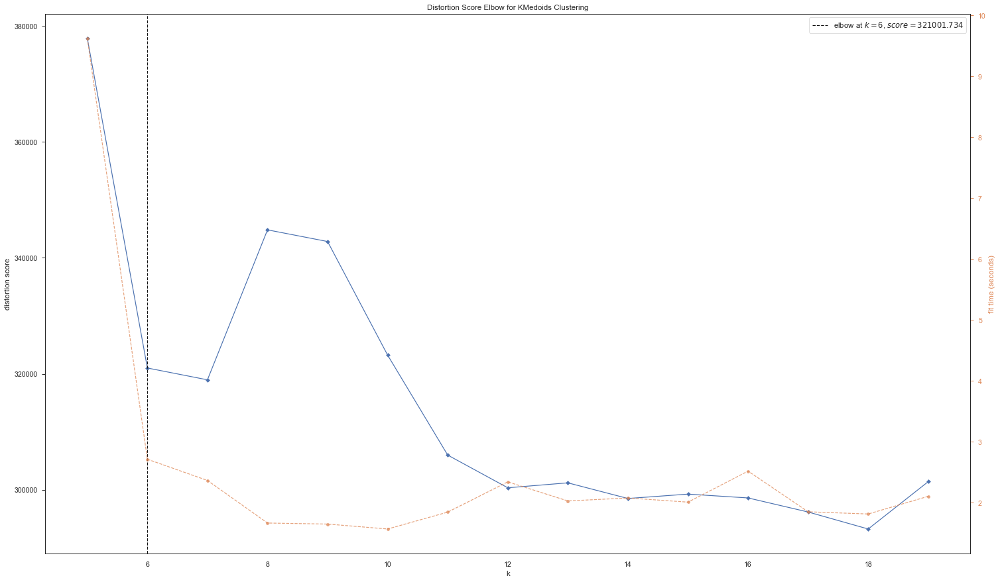

<AxesSubplot:title={'center':'Distortion Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='distortion score'>

In [22]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot

fig, ax = plt.subplots(figsize=(25,15))

# Utilise the Elbow Visualiser package and specify the details of the model

elb = KElbowVisualizer(KMedoids(metric = 'precomputed', random_state=9), k=(5,20), color=['#002034', "#82ceff"])
elb.fit(mat_gower_n)        
elb.show()

##### FasterPAM

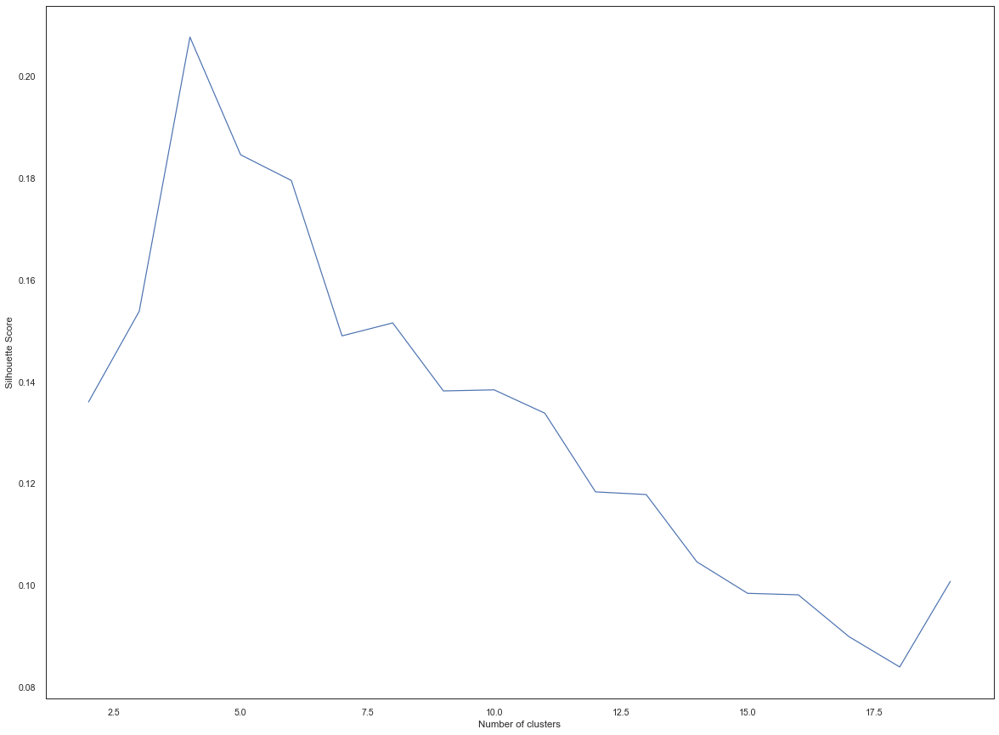

In [24]:
plt.figure(figsize=(20,15))

# create a dictionary of results

results = {}

# create a loop to ieterate through different options

for i in range(2,20):
    m = fasterpam(mat_gower_n, medoids = i, max_iter = 1000, init ='random',) # specify the model and dataset
    labels = m.labels # retrieve the labels
    sil_index = silhouette_score(mat_gower_n, labels) # calculate the silhoutte score
    results.update({i: sil_index}) # update the results on the dictionary
    
##### FasterPAM##### FasterPAM
# plot the results and their respective values

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

### Cosine

##### K-Medoids

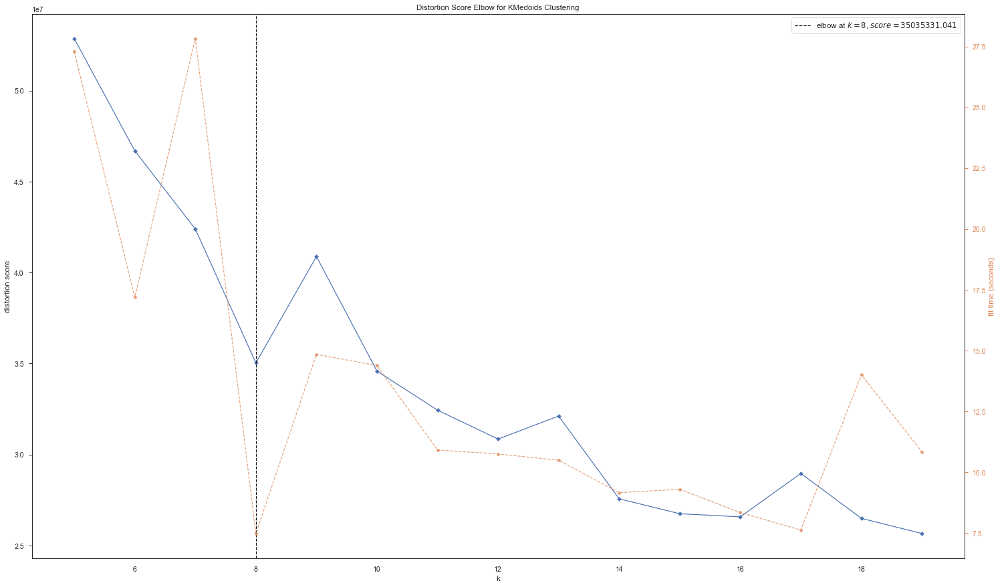

<AxesSubplot:title={'center':'Distortion Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='distortion score'>

In [25]:
# set the basic format (i.e. the palette for the color and the backgrounds)

sns.set(rc={'axes.facecolor':'white'})
sns.set_context("paper", font_scale = 1.2)
sns.set_style("white")

# set the size of the plot

fig, ax = plt.subplots(figsize=(25,15))

# Utilise the Elbow Visualiser package and specify the details of the model

elb = KElbowVisualizer(KMedoids(metric = 'cosine', random_state=9), k=(5,20), color=['#002034', "#82ceff"])
elb.fit(final_nonzero)        
elb.show()

##### FasterPAM

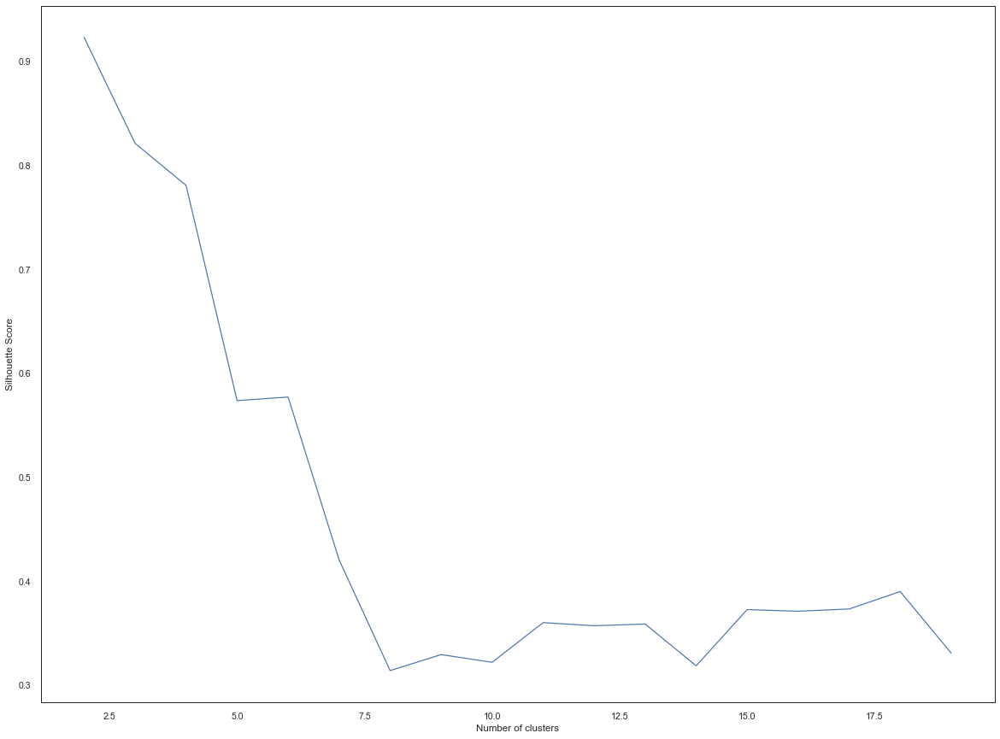

In [27]:
plt.figure(figsize=(20,15))

# create a dictionary of results

results = {}

# create a loop to ieterate through different options

for i in range(2,20):
    m = fasterpam(mat_cos_n##### FasterPAM, medoids = i, max_iter = 1000, init ='random',) # specify the model and dataset
    labels = m.labels # retrieve the labels
    sil_index = silhouette_score(mat_cos_n, labels) # calculate the silhoutte score
    results.update({i: sil_index}) # update the results on the dictionary
    

# plot the results and their respective values

plt.plot(list(results.keys()), list(results.values()))
plt.xlabel("Number of clusters")
plt.ylabel("Silhouette Score")
plt.show()

###  Non-Zero <a class="anchor" id="NN"></a>

Once again the best performing distance was the Minkowski distance, followed by the Euclidean. As a result in future Notebooks only the Minkowski distance will be used for K-Medoids.

Given that KMedoids produced a low number of clusters, we shall adopt a larger number which still produces a good result, this shall be 8. We will adopt a total of 8 clusters for FasterPAM too. This reasoning is derived by the fact that applying a lower number for each would result in too few clusters.

#### K-Modes  <a class="anchor" id="M8"></a>

In [39]:
# we set the function for K-Modes

km_nonzero = KMedoids(n_clusters=8, init='build', max_iter = 1000, metric = 'minkowski', random_state = 9)
fast_nonzero = fasterpam(mat_min_n, medoids = 8, max_iter = 1000, init ='random', random_state = 9)

# Fit the function to the original nonzero dataset

km_nonzero.fit(final_nonzero)

# Assign the labels to the respective rows and further view the cluster segmentation 

final_nonzero['Cluster_kmode'] = km_nonzero.labels_

tra_nonzero['Cluster_kmode'] = km_nonzero.labels_

nonzero_df["Cluster_kmode"] = km_nonzero.labels_
print('Distribution of the Clusters: \n')
print(nonzero_df['Cluster_kmode'].value_counts())
print('\n')


# Assign the labels to the respective rows and further view the cluster segmentation 

final_nonzero['Cluster_fast'] = fast_nonzero.labels

tra_nonzero['Cluster_fast'] = fast_nonzero.labels

nonzero_df["Cluster_fast"] = fast_nonzero.labels
print('Distribution of the Clusters: \n')
print(nonzero_df['Cluster_fast'].value_counts())

Distribution of the Clusters: 

3    2869
5    2447
0    2220
4    2065
7    1546
2    1113
1     826
6     721
Name: Cluster_kmode, dtype: int64


Distribution of the Clusters: 

3    2422
2    2221
0    2192
6    2091
4    1507
5    1387
1    1160
7     827
Name: Cluster_fast, dtype: int64


In [40]:
print('The performance scores are the following: \n' )
print('KMedoids')
print('Silhouette: ' + str(silhouette_score(final_nonzero, final_nonzero["Cluster_kmode"])))
print('Calinski Harabasz: ' + str(calinski_harabasz_score(final_nonzero, final_nonzero["Cluster_kmode"])))
print('Davies Bouldin: ' + str(davies_bouldin_score(final_nonzero, final_nonzero["Cluster_kmode"])))
print('\n')
print('FastPAM')
print('Silhouette: ' + str(silhouette_score(final_nonzero, fast_nonzero.labels)))
print('Calinski Harabasz: ' + str(calinski_harabasz_score(final_nonzero, fast_nonzero.labels)))
print('Davies Bouldin: ' + str(davies_bouldin_score(final_nonzero, fast_nonzero.labels)))

The performance scores are the following: 

KMedoids
Silhouette: 0.3984698284890244
Calinski Harabasz: 55041.253100736285
Davies Bouldin: 0.974965637477379


FastPAM
Silhouette: 0.4479912757117179
Calinski Harabasz: 57435.127172260065
Davies Bouldin: 0.8578977216250953


Just like in the zero dataset FasterPAM produces better results.

### Nonzero Visualisation <a class="anchor" id="N00"></a>

We can now plot the best performing model. <br>

In [41]:
# we remove the clusters from a new dataset

tt = tra_nonzero.drop(columns=['Cluster_kmode', 'Cluster_fast'])

# we create two dfs, one for 2 components and one for 3

PCs_2d = pd.DataFrame(pca_2d.fit_transform(tt))
PCs_3d = pd.DataFrame(pca_3d.fit_transform(tt))


# PC1_2d: The first component. PC2_2d: The second component, etc-

PCs_2d.columns = ["PC1_2d", "PC2_2d"]

PCs_3d.columns = ["PC1_3d", "PC2_3d", "PC3_3d"]

# we create a new df

tra_nonzero1=tra_nonzero.copy()

# we concatonate all dfs together to then derive visuals

tra_nonzero1 = pd.concat([tra_nonzero1,PCs_2d,PCs_3d], axis=1, join='inner')

In [42]:
# we create a new variable for each cluster in the dataset so we create two empty lists

cluster = []
idd = []

# we then create a loop to iterate through the values

for i in tra_nonzero1["Cluster_fast"].value_counts().index:
    n = i
    id_ = 'cluster_' + str(n) # for each id we create a new variable
    m = str(id_) +  ' = ' + 'tra_nonzero1[tra_nonzero1["Cluster_fast"] == ' + str(n) + ']' # we then define the variable 
    idd.append(id_) # we append its id to the list
    cluster.append(m) # we append the variable to the list

# we then create a loop to execute all of the new variables created
    
for i in cluster:
    exec(i)

    
# we create two new lists, one to contain the different PCA plots, the other to store the trace (i.e. id of the plot)
    
nn = []
l = []    
for i in idd:
    b = 'trace' + i 
    p = 'go.Scatter(x =' + i + '["PC1_2d"], y =' + i + '["PC2_2d"], mode = "markers", text = None)'
    l.append(b)
    nn.append(p)
    
# we create a dictionary to ensure that all traces are correctly defined  
    
commands = {}
for a,b in zip(nn,l):
    key=str(b)
    commands[key]=a

# we execute the dictionary and create the individual plots  
    
for key, value in commands.items():
    exec (f'{key}={value}')            
   

In [43]:
# we retrieve all the new features

for i in l:
    print(i)

tracecluster_3
tracecluster_2
tracecluster_0
tracecluster_6
tracecluster_4
tracecluster_5
tracecluster_1
tracecluster_7


In [44]:
# we set a title for the graph

title = "Visualizing Clusters in Two Dimensions Using PCA"


# we set an appropriate layout 

layout = dict(title = title,
              xaxis= dict(title= 'P1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'P2',ticklen= 5,zeroline= False)
             )

# we zip all the traces to create one figure

fig = go.Figure(dict(data = [tracecluster_3,
tracecluster_2,
tracecluster_0,
tracecluster_6,
tracecluster_4,
tracecluster_5,
tracecluster_1,
tracecluster_7]), layout = layout)

pyo.iplot(fig)

# we save the dataset

fig.write_image("Kmode_orig_2_N.png", scale=2)

In [45]:
nn = []
l = []    
for i in idd:
    b = 'trace' + i 
    p = 'go.Scatter3d(x =' + i + '["PC1_2d"], y =' + i + '["PC2_2d"], z =' + i + '["PC3_3d"], mode = "markers", text = None)'
    l.append(b)
    nn.append(p)
    
commands = {}
for a,b in zip(nn,l):
    key=str(b)
    commands[key]=a
            
for key, value in commands.items():
    exec (f'{key}={value}')     

In [46]:
for i in l:
    print(i)

tracecluster_3
tracecluster_2
tracecluster_0
tracecluster_6
tracecluster_4
tracecluster_5
tracecluster_1
tracecluster_7


In [47]:
# we set a title for the graph

title = "Visualizing Clusters in Three Dimensions Using PCA"


# we set an appropriate layout 

layout = dict(title = title,
              xaxis= dict(title= 'P1',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'P2',ticklen= 5,zeroline= False)
             )

# we zip all the traces to create one figure

fig = go.Figure(dict(data = [tracecluster_3,
tracecluster_2,
tracecluster_0,
tracecluster_6,
tracecluster_4,
tracecluster_5,
tracecluster_1,
tracecluster_7]), layout = layout)

pyo.iplot(fig)

# we save the dataset

fig.write_image("Kmode_orig_3_N.png", scale=2)